# Indice:
* [Componenti delle serie storiche](#componenti-ts)
* [Serie storiche gerarchiche](#gerarchica-ts)

# Scopo della tesi

La tesi ha lo scopo di descrivere il lavoro svolto durante il tirocinio presentando anche una parte della teoria che troviamo all'interno del lavoro. La tesi è divisa in due sezioni, nella prima troviamo il principio di decomposizione e il lavoro svolto sui dati di un negozio di Albignasego mentre nella seconda troviamo le serie gerarchiche con il lavoro sui dati della competizione M5.

# Cosa sono le serie storiche?

Per serie storica, o temporale, intendiamo una successione di valori, ordinati nel tempo, che catturano l'evoluzione di un dato fenomeno, esempio la quantità di merce che si trova in un magazzino oppure l'andamento del settore energetico ecc. Il periodo che passa fra un valore e il successivo può essere fisso o variabile. Noi lavoreremo su serie temporali con "periodo di campionamento" fisso.

<img src="img/esempio_ts.png" alt="Drawing" style="width:90%;"/>
<br/><center><b>Vendite delle maglie del negozio di Albignasego</b></center>


# Componenti delle serie storiche <a class='anchor' id='componenti-ts'/>

Le serie storiche possono risultare difficili da interpretare ed analizzare ad un primo sguardo, ed è quindi molto conveniente dividerle in componenti più semplici che sono: il trend (T),la stagionalità (S) e i residui (R).

Il trend è quel movimento, di lungo periodo, che evidenzia l'andamento generale della serie; in generale ci riferiamo ad esso quando osserviamo un incremento o un decremento (non necessariamente lineare) nei dati.

La stagionalità invece è un oscillazione che dipende da fattori legati al tempo, al clima o a "periodicità" di altra natura. Questa componente ha un andamento simile a quello di una funzione periodica, simile in quanto i metodi di decomposizione moderni tendono a far sì che $f(t)\approx f(t + \tau)$, dove $\tau$ indica il periodo.

I residui infine sono un movimento di natura irregolare e lo possiamo pensare come l'errore che abbiamo fra la serie originale e la somma o prodotto delle due componenti (T e S). La caratteristica di questa componente è quello di essere stazionaria in media cioè di oscillare intorno ad un valore costante 0.

Formalemente la decomposizione la possiamo definire in due modi, in modo addittivo $y_t = T_t + S_t + R_t$ e in modo moltiplicativo $y_t = T_t * S_t * R_t$. Usiamo il modello addittivo quando le componenti l'ampiezza di $S_t$ non varia a seconda del livello della serie mentre usiamo il moltiplicativo quando all'aumentare del livello della serie proporzionalmente aumenta o diminuisce l'ampiezza della stagionalità. Va inoltre ricordato che usando le proprietà dei logaritmi possiamo scrivere:  $\log{y_t}=\log({T_t * S_t * R_t})=\log{T_t}+\log{S_t}+\log{R_t}$. 

<img src="img/esempio_decomposizione.png" alt="Drawing" style="width:90%;"/>
<br/><center><b>Decomposizione additiva sulle vendite delle maglie del negozio di Albignasego</b></center>

## Media mobile

Prima di introdurre il principio della decomposizione, va definito lo strumento con cui estrarre da una serie temporale la componente trend. La media mobile di ordine m (m - MA) viene scritta come:
\begin{equation*}
T_t=\frac{1}{m} \sum_{i=-k}^k y_{t+i}
\end{equation*}

dove $m = 2k + 1$. Eseguire la media nell'intorno $[t-k \dots t+k]$ consente di eliminare una parte dei disturbi presenti nelle osservazioni infatti per valori molto vicini fra loro la media risulterà quasi uguale ai valori stessi.

Nel caso in cui m sia un valore pari allora definiremo la  2 x m - MA come la media mobile m - MA seguita poi da una 2 - MA. La 2 - MA viene applicata per avere un risultato simmetrico. Ad esempio, supponiamo di dover calcolare la 2 x 4 - MA allora:

\begin{equation*}
T_t=\frac{1}{2}[\frac{1}{4}(y_{t-2}+y_{t-1} + y_{t} + y_{t+1}) + \frac{1}{4}(y_{t-1}+y_{t} + y_{t+1} + y_{t+2})] \\
=\frac{1}{8}y_{t-2} + \frac{1}{4}y_{t-1} + \frac{1}{4}y_{t} + \frac{1}{4}y_{t+1} + \frac{1}{8}y_{t+2}
\end{equation*}

## Metodo di decomposizione classico

Nonostante questo metodo sia stato introdotto circa un secolo fa, è ancora importante poiché costituisce la base dei moderni metodi di decomposizione come X11, SEATS e STL (questi presentano step aggiuntivi rispetto al metodo classico). Il metodo consta di 3 passaggi:

1. Uso della media mobile di ordine m (o 2 x m) sulla serie $y_t$ per individuare la componente trend.

2. Supponendo $y_t$ sia a valori mensili, allora si calcola la media dei valori della serie $y_t - T_t$ (serie de-trendizzata) che fanno riferimento allo stesso mese. In questo modo otterremmo 12 valori. Infine costruiamo la componente stagionale $S_t$ replicando i valori appena ottenuti per tutti gli anno della serie.

3. I residui si trovano semplicemente eseguendo $R_t = y_t - T_t - S_t$

Per il modello moltiplicativo i passaggi sono pressochè identici tuttavia la serie de-trendizzata si trova facendo $\frac {y_t} {T_t}$ mentre i residui facendo $R_t = \frac{y_t}{T_t S_t}$

### Problematiche

All'apparenza il metodo classico sembra comportarsi bene tuttavia esistono due principali problematiche:

- Se consideriamo di trovare $T_t$ usando 11-MA vedremo che per le prime e le ultime 5 osservazioni della serie $y_t$ non saranno disponibili i corrispettivi valori di $T_t$ in quanto cercheremo di eseguire la media su valori non esistenti. Esempio per t=1 dovremmo calcolare la media delle osservazioni nell'intervallo [1-5 .. 1+5], e i valori per -1, -2, ecc. non sono presenti.

- Il modo in cui la componente stagionale viene determinata può funzionare per serie temporali non troppo lunghe ma soprattutto dove il pattern della stagionalità non varia particolarmente nel tempo.

## Misure del trend e della stagionalità

Sfruttando la decomposizione appena introdotta, possiamo ora misurare la forza delle componenti trend e stagionalità nelle serie storiche. Supponiamo di avere $y_t = T_t + S_t + R_t$ con un forte impronta del trend, allora la serie de-stagionalizzata (togliamo la stagionalità per misurare il trend) avrà variazioni molto maggiori dei residui. Con $F_T$ indichiamo la forza del trend che calcoliamo come
\begin{equation*}
F_T=max\Big(0, 1-\frac{Var(R_t)}{Var(T_t + R_t)}\Big)
\end{equation*}

In questo modo, più $F_T$ è vicino a 1 più la componente è presente all'interno della serie. L'uso della funzione $max()$ è giustificato dal fatto che a volte capita che la varianza dei residui sia molto maggiore della varianza calcolata su $T_t + R_t$ quindi il rapporto delle due varianze genera un valore $> 1$. 

Analogamente a sopra, possiamo calcolare la forza della stagionalità calcolando il rapporto fra la varianza dei residui e la varianza della serie de-trendizzata.

\begin{equation*}
S_T=max\Big(0, 1-\frac{Var(R_t)}{Var(S_t + R_t)}\Big)
\end{equation*}

## Previsioni con decomposizione

La decomposizione può anche essere usata anche per le previsioni. Se consideriamo $y_t$ decomposta addittivamente ($y_t=T_t + S_t + R_t$) e supponiamo la stagionalità non vari in maniera importante allora la previsione della stagionalità viene eseguita usando un seasonal-naif (replichiamo il valore di $m$ istanti fa, dove m è la stagionalità della serie), mentre per le altre componenti possono essere usati ARIMA, Simple Exponention Smoothing ecc. 

Questo modus operandi è vantaggioso soprattutto quando le serie temporali sono a stagionalità multipla. Usando ARIMA o ETS, in genere, generiamo delle previsioni meno accurate (causa della stagionalità multipla) rispetto a decomporre la serie ed eseguire le previsioni sulle componenti semplici. 

<img src="img/esempio_prev_decom_1.png" alt="Drawing" style="width:90%;"/>
<br/><center><b>Previsioni sulla componente trend delle vendite delle maglie del negozio di Albignasego</b></center>
<img src="img/esempio_prev_decom_2.png" alt="Drawing" style="width:90%;"/>
<br/><center><b>Previsioni sulla componente residui delle vendite delle maglie del negozio di Albignasego</b></center>
<img src="img/esempio_prev_decom_3.png" alt="Drawing" style="width:90%;"/>
<br/><center><b>Previsioni sommando tutte le previsioni di tutte le componenti (T,S,R)</b></center>

## Esempio con i dati di Albignasego

Ora applichiamo quanto definito finora ai dati di vendita di un negozio di abbigliamento. Andremo a provare la decomposizione sulla serie delle vendita delle maglie

Nella prima cella troviamo gli import per caricare le varie librerie e definiamo un gruppo di variabili che servono a uniformare l'aspetto dei diversi grafici.

In [16]:
# -*- coding: utf-8 -*-

# IMPORT 
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import datetime as dt
from statsmodels.tsa.holtwinters import ExponentialSmoothing

from statsmodels.tsa.arima_model import ARIMA
from statsmodels.tsa.seasonal import seasonal_decompose

from statsmodels.tsa.stattools import acf, pacf, adfuller

# sopprimiamo i warning
np.warnings.filterwarnings('ignore')

# PARAMETRI PER LA VISUALIZZAZIONE DEI GRAFICI
SMALL_SIZE = 32
MEDIUM_SIZE = 34
BIGGER_SIZE = 40

TSC = 'black'   # training set
VSC = 'black'   # validation set
FC = 'red'      # previsioni
MRC = 'green'   # model results
OLC = 'orange'  # other lines

plt.rc('font', size=MEDIUM_SIZE)         # controls default text sizes 
plt.rc('axes', titlesize=SMALL_SIZE)     # fontsize of the axes title 
plt.rc('axes', labelsize=MEDIUM_SIZE)    # fontsize of the x and y labels 
plt.rc('xtick', labelsize=SMALL_SIZE)    # fontsize of the tick labels 
plt.rc('ytick', labelsize=SMALL_SIZE)    # fontsize of the tick labels 
plt.rc('legend', fontsize=SMALL_SIZE)    # legend fontsize 
plt.rc('figure', titlesize=BIGGER_SIZE)  # fontsize of the figure title

Nella seconda cella andremo a definire le funzioni che richiameremo poi nel main.
- strength_seasonal_trend calcola la forza sia della componente trend sia della stagionale passando come parametro, oltre alla serie temporale, il periodo di stagionalità e ritornanando la coppia di valori. All'interno usiamo la funzione seasonal_decompose per ottenere le tre componenti e infine calcoliamo le due forze facendo il rapporto fra le varianze.

- test_stationarity esegue il test di Dickey-Fuller aumentato per controllare se la serie è stazionaria oppure no. Nel caso di serie stazionarie in media, è possibile capire se la serie è stazionaria o meno calcolando la media mobile della serie e guardando se questa assomiglia ad una retta costante.

In [17]:
def strength_seasonal_trend(ts, season=12):
    '''
    La funzione calcola, sfruttando la decomposizione delle serie storiche, la forza della
    stagionalità e del trend
    
    Parameters
    ----------
    ts : pandas.Series
        Serie temporale
    season: int
        periodo di stagionalità
        
    Returns
    -------
    strength_seasonal : float
        Forza della stagionalità
    strength_seasonal_trend : float
        Forza del trend

    '''
    # usiamo la funzione che decompone la serie storica usando periodo=season che di default vale 12
    decomposition = seasonal_decompose(ts, period=season)
    
    # recuperiamo le varie componenti
    trend = decomposition.trend
    seasonal = decomposition.seasonal
    residual = decomposition.resid
    
    # applichiamo le formule viste nella teoria
    strength_trend = max(0, 1 - residual.var()/(trend + residual).var())
    strength_seasonal = max(0, 1 - residual.var()/(seasonal + residual).var())
    
    # ritorniamo la forza stagionale e la forza del trend
    return (strength_seasonal, strength_trend)


def test_stationarity(ts):
    '''
    https://www.performancetrading.it/Documents/PmEconometria/PmEq_Dickey_Fuller.htm
    Esegue un test di stazionarietà usando il test Dickey-Fuller. 
    Controlliamo se il valore di 'test statistic' 
    è minore del valore critico 1% così da avere una buona certezza di stazionarietà
    Parameters
    ----------
    ts : pandas.Series
        Serie temporale

    Returns
    -------
    True se stazionaria, False non stazionaria
    
    '''
    print('Risultati del test di Dickey-Fuller aumentato:')
    dftest = adfuller(ts, autolag='AIC')
    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic', 'p-value', '#Lags Used', 'Number of Observations Used'])
    
    # Valori critici
    for key, value in dftest[4].items():
        dfoutput['Critical Value (%s)' % key] = value
    print(dfoutput);print('\n')
    
    return dftest[0] < dftest[4]['1%']     # Abbiamo il 99% che la serie sia stazionaria

In questa cella abbiamo il main, che comprende numerosi passaggi. Quindi di seguito troviamo un elenco puntato che riassume i vari passaggi dentro il main.

1. carichiamo i dati di vendita del negozio e recuperiamo quelli delle MAGLIE.

2. definire l'insieme delle osservazioni su cui creeremo i modelli di previsione (training set) e l'insieme delle osservazioni che valideranno la bontà del nostro modello (validation set).

3. studiamo il training set 
 - creando il grafico del training set e i grafici di auto-correlazione e auto-correlazione parziale
 - studiamo la stazionarietà usando la funzione definita nella cella precedente

4. calcoliamo i valori di forza delle componenti trend e stagionalità del training set considerando come periodo di stagionalità 365. Dal grafico di auto-correlazione si può osservare che la serie presenta stagionalità multiple a 7 e a 365

5. decomponiamo il training set e ricaviamo le tre componenti

6. creiamo i modelli di previsione delle componenti usando ETS. Per i residui, che sono una serie stazionaria, verrà usato ARIMA visto che Simple Exponential Smoothing (modello di previsione delle serie che non presentano trend e stagionalità) ha la caratteristica di generare delle previsioni "piatte" ovvero $y_{\overline{t} + h} = y_{\overline{t} + h - 1} = \dots = y_{\overline{t} + 1}$, dove $y_{\overline{t}}$ è l'ultimo valore disponibile della serie

7. realizziamo gli intervalli di predizione per ETS dato che non li genera la funzione
8. sommiamo i modelli di previsione
9. sommiamo le previsioni
10. creiamo il grafico che mette a confronto la serie con i valori del modello


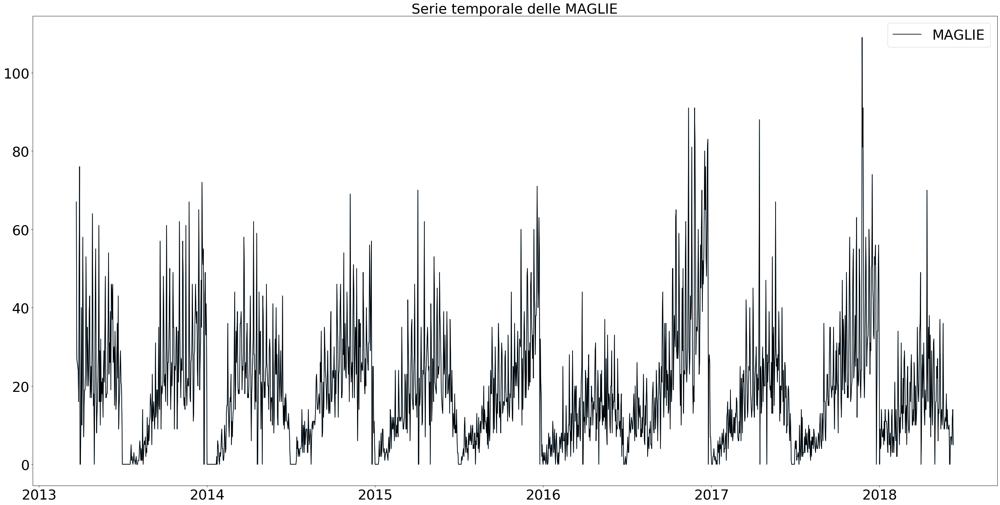

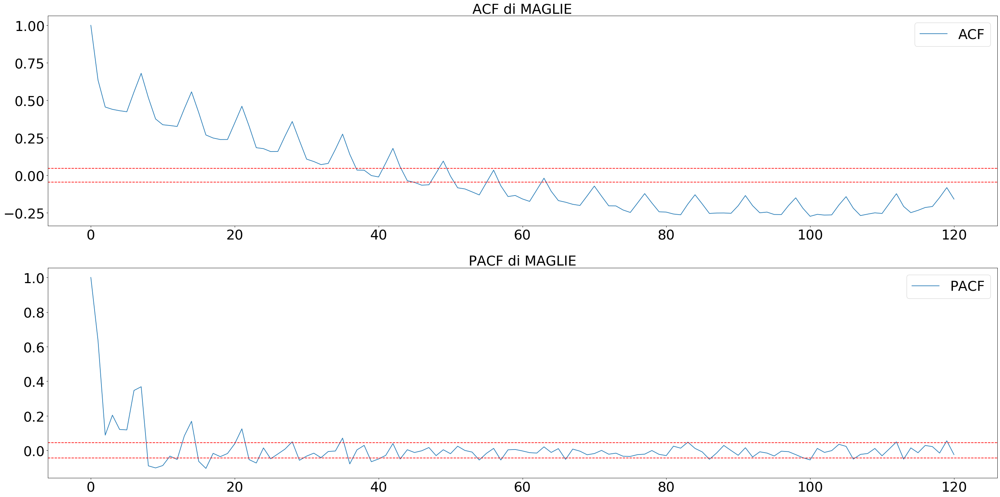

Risultati del test di Dickey-Fuller aumentato:
Test Statistic                   -5.241576
p-value                           0.000007
#Lags Used                       22.000000
Number of Observations Used    1883.000000
Critical Value (1%)              -3.433828
Critical Value (5%)              -2.863076
Critical Value (10%)             -2.567588
dtype: float64


La serie temporale MAGLIE è stazionaria
Forza dei gradi stagionalita (0.6002188215217722), trend(0.03872350006789216)


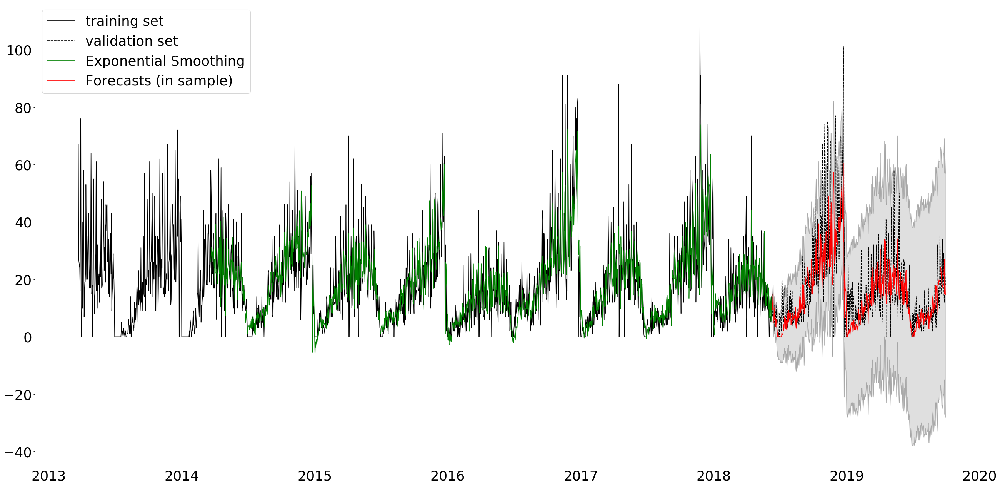

In [19]:
if __name__ == "__main__":
    # stagionalità della serie in numero di giorni
    year = 365
    week = 7
    
    # L'insieme di dati contiene la data e il numero di capi di abbigliamento venduti
    # in quel giorno (per tipo).
    
    dateparser = lambda dates: dt.datetime.strptime(dates, '%Y-%m-%d')
    data = pd.read_csv('./Dati_Albignasego/Whole period.csv', index_col=0, date_parser=dateparser)
    
    # usiamo solo la serie MAGLIE.
    
    ts = data['MAGLIE'] 
    
    # definiamo il training-set (80% dei dati della serie) e il validation-set (rimanente 20%)
    train = ts[pd.date_range(start=ts.index[0], end=ts.index[int(len(ts) * 0.8)], freq='D')]
    valid = ts[pd.date_range(start=ts.index[int(len(ts)*0.8)+1], end = ts.index[int(len(ts))-1], freq='D')]
    
    # Facciamo uno studio della serie temporale
    
    # grafichiamo la serie temporale
    plt.figure(figsize=(40, 20), dpi=80)
    plt.title("Serie temporale delle MAGLIE")
    plt.plot(train)
    plt.plot(train, label='MAGLIE', color="black")
    plt.legend(loc='best');
    plt.show()
        
    # Cerchiamo di capire se la serie è stagionale e/o presenta trend dalla funzione acf
    auto_cor = acf(train, nlags=120, fft=True)
    part_auto_cor = pacf(train, nlags=120)
    
    plt.figure(figsize=(40, 20), dpi=80)
    plt.subplot(211)
    plt.title("ACF di MAGLIE")
    plt.plot(auto_cor,  label='ACF')
    
    plt.axhline(y=-1.96/np.sqrt(len(train)), linestyle='--', color='red')
    plt.axhline(y=1.96/np.sqrt(len(train)), linestyle='--', color='red')
    plt.legend(loc='best');
    
    plt.subplot(212)
    plt.title("PACF di MAGLIE")
    plt.plot(part_auto_cor, label='PACF')
    plt.axhline(y=-1.96/np.sqrt(len(train)),linestyle='--', color='red')
    plt.axhline(y=1.96/np.sqrt(len(train)),linestyle='--', color='red')
    plt.legend(loc='best');
    plt.show()
    
    
    # Dal grafico della funzione ACF osserviamo che serie presenta stagionalità
    isStationary = test_stationarity(train)
        
    if (isStationary):
        print('La serie temporale MAGLIE è stazionaria')
    else:
        print('La serie temporale MAGLIE NON è stazionaria')
    
    # Calcoliamo la forza delle componenti stagionalità e trend usando il procedimento illustrato nella teoria
    strength_s, strength_t = strength_seasonal_trend(train, year)
    
    print('Forza dei gradi stagionalita (%s), trend(%s)'%(str(strength_s), str(strength_t)))
    
    
    # Usiamo i modelli di Holt & Winters (Exponential Smoothing per serie con trend)
    # e ARIMA per la previsione delle componenti TREND e RESIDUI.
    
    # decomponiamo la serie temporale
    decomposition = seasonal_decompose(train, period=year, two_sided=False)
    
    trend = decomposition.trend
    seasonal = decomposition.seasonal
    residual = decomposition.resid
    
    trend.dropna(inplace=True)
    seasonal.dropna(inplace=True)
    residual.dropna(inplace=True)

    # Creiamo dei modelli per trend e seasonal 
    trend_model = ExponentialSmoothing(trend, trend="add", damped = True, seasonal=None)
    
    # Qua potevamo eseguire un seasonal-naif visto che la stagionalità varia lentamente nel tempo
    seasonal_model = ExponentialSmoothing(seasonal, trend=None, seasonal='add', seasonal_periods=year)
    
    # i residui sono una serie stazionaria quindi è meglio usare ARIMA con d=0
    residual_model = ARIMA(residual, order=(1, 0, 6))
    
    # fit model
    trend_fitted    = trend_model.fit()
    seasonal_fitted = seasonal_model.fit()
    residual_fitted = residual_model.fit()
    
    # realizziamo le predizioni con lo stesso periodo del validation set!
    trend_model_predictions = trend_fitted.forecast(steps = int(len(valid)))
    seasonal_model_predictions = seasonal_fitted.forecast(steps = int(len(valid)))
    residual_model_predictions, _, _ = residual_fitted.forecast(steps = int(len(valid)))

    #Sommiamo i modelli
    model_predictions = trend_model_predictions \
                        + seasonal_model_predictions \
                        + residual_model_predictions
                        
    model_predictions.dropna(inplace=True)
    
    # annulliamo i valori negativi visto che non possono esserci vendite negative  
    for i in range(1, len(model_predictions)):
        if model_predictions[i] < 0:
            model_predictions[i] = 0
    
    
    # creiamo gli intervalli di predizione 
    z = 1.96
    sse = trend_fitted.sse + seasonal_fitted.sse
    
    # inizializziamo intervalli di predizione
    predint_xminus = ts[pd.date_range(start=ts.index[int(len(ts)*0.8)+1], end = ts.index[int(len(ts))-1], freq='D')]
    predint_xplus  = ts[pd.date_range(start=ts.index[int(len(ts)*0.8)+1], end = ts.index[int(len(ts))-1], freq='D')]
    
    for i in range(1, len(model_predictions)):
        predint_xminus[i] = model_predictions[i] - z * np.sqrt(sse/len(valid)+i)
        predint_xplus[i]  = model_predictions[i] + z * np.sqrt(sse/len(valid)+i)
    
    # realizziamo i plot dei modelli
    plt.figure(figsize=(40, 20), dpi=80)
    plt.plot(train, label="training set", color=TSC)
    plt.plot(valid, label="validation set", color =VSC, linestyle = '--')
    plt.plot(trend_fitted.fittedvalues + 
             seasonal_fitted.fittedvalues + 
             residual_fitted.fittedvalues, label="Exponential Smoothing", color=MRC)
    plt.plot(model_predictions, label="Forecasts (in sample)", color=FC)
    plt.plot(predint_xminus, color="grey", alpha = .5)
    plt.plot(predint_xplus, color="grey", alpha = .5)
    plt.fill_between(pd.date_range(start="2018-06-11", periods=len(valid) , freq='D'), 
                 predint_xplus, 
                 predint_xminus, 
                 color='grey', alpha=.25)
    plt.legend(loc='best')
    plt.plot()
    

### Osservazioni

Per testare l'efficacia delle previsioni con decomposizione sono state realizzate delle previsioni, sulla stessa serie temporale, usando ancora ETS ma applicato serie nella sua interezza. Di seguito troviamo le figure che mostrano le previsioni.

<img src="img/esempio_ETS.png" alt="Drawing" style="width:90%;"/>
<br/><center><b>Previsioni con ETS sulla serie intera</b></center>

<img src="img/esempio_ETS_decomposizione.png" alt="Drawing" style="width:90%;"/>
<br/><center><b>Previsioni con ETS sulla serie decomposta</b></center>

Per confrontare le previsioni si usano le metriche d'errore. Riporto in una tabella le metriche MAE e MSE di ETS sulla serie intera e sulla serie decomposta.

|     | ETS senza decomposizione  | ETS con decomposizione    | 
| --- | -------: | -------: |
| MSE | 196.6783 | 158.0498 |
| MAE |   9.5166 |   8.4453 |


Dalle metriche si osserva che le previsioni migliori le otteniamo decomponendo la serie temporale ed eseguendo le previsioni sulle singole componenti.


# Serie storiche gerarchiche <a class='anchor' id='gerarchica-ts'/>

## Introduzione
Introduciamo le serie gerarchiche per mezzo di un esempio. Supponiamo di avere i dati di vendita mensili di ogni prodotto di un supermercato e di voler prevedere le vendite totali del negozio del mese prossimo. La serie che a noi interessa, ovvero le vendite totali del negozio, è ricavabile sommando i dati di vendita dei singoli prodotti. Le serie delle vendite dei singoli prodotti permettono di trovare non solo le vendite totali del negozio, ma anche le vendite di una specifica categoria di prodotti. Diamo dunque il nome di gerarchica a quella collezione di serie storiche che sono legate fra loro e che formano una struttura gerarchica ad albero.

Consideriamo ora la serie gerarchica composta da 3 livelli mostrata nella figura sottostante.

<img src="img/gerarchia.png" alt="Drawing" style="width: 30%;"/>
<br/><center><b>Serie gerarchica composta da 3 livelli</b></center>

Con $n$ indichiamo il numero totale di serie all'interno della struttura (8 in questo caso 1+2+5) mentre con $m$ indichiamo il numero di serie che stanno al livello più basso della gerarchia, dove $n > m$.

Scriviamo formalmente le relazioni, definite intuitivamente nell'esempio del supermercato, che legano le serie di livello inferiore con quelle di livello superiore.

- $y_t=y_{AA,t} + y_{AB,t} + y_{AC,t} + y_{BA,t} + y_{BB,t}$

- $y_{A,t}=y_{AA,t} + y_{AB,t} + y_{AC,t}$

- $y_{B,t}=y_{BA,t} + y_{BB,t}$

- $y_t=y_{A,t} + y_{B,t}$

Piccola nota. La sintassi prevede l'uso di due pedici, il primo per denotare il nodo e il secondo per l'osservazione quindi $y_{AB,\overline{t}}$ individua la $\overline{t}$-esima osservazione della serie corrispondente al nodo AB.

Le equazioni possono essere riscritte come 

\begin{gather}
    \begin{bmatrix}
    y_t \\
    y_{A,t} \\
    y_{B,t} \\
    y_{AA,t} \\
    y_{AB,t} \\
    y_{AC,t} \\
    y_{BA,t} \\
    y_{BB,t}
    \end{bmatrix}
    =
    \begin{bmatrix}
    1 & 1 & 1 & 1 & 1 \\
    1 & 1 & 1 & 0 & 0 \\
    0 & 0 & 0 & 1 & 1 \\
    1 & 0 & 0 & 0 & 0 \\
    0 & 1 & 0 & 0 & 0 \\
    0 & 0 & 1 & 0 & 0 \\
    0 & 0 & 0 & 1 & 0 \\
    0 & 0 & 0 & 0 & 1
    \end{bmatrix}
    \begin{bmatrix}
    y_{AA,t} \\
    y_{AB,t} \\
    y_{AC,t} \\
    y_{BA,t} \\
    y_{BB,t}
    \end{bmatrix}
\end{gather}

<br/>
<center>$\hat{y_t} = S b_t$ </center>




dove $\hat{y_t}$ è un vettore n-dimensionale che rappresenta tutte le serie temporali all'istante t, $b_t$ è m-dimensionale e contiene le serie alla base della gerarchia infine abbiamo la matrice delle somme indicata con $S$ di dimensione $nxm$. Da notare il fatto che le prime tre righe della matrice $S$ corrispondono alle prime tre equazioni, mentre il resto della matrice è uguale alla matrice di identità $I_m$.


## Previsioni

Le previsioni su una serie gerarchica possono essere fatte creando dei modelli per ogni singola serie, tuttavia questo tipo di approccio risulta estremamente lento soprattutto se la struttura presenta un numero elevato di nodi. Inoltre questo modus operandi non tiene in considerazione le relazioni che esistono fra i vari nodi dell'albero e potrebbero dunque sussistere delle incoerenze fra le varie previsioni. Definiamo dunque 3 approcci per le previsioni:
- Bottom-up
- Top-down
- Middle-out

### Bottom-up

Questo metodo è il più semplice fra i tre in quanto prevede di creare le previsione delle serie che stanno alla base della gerarchia, per poi sommarle insieme, seguendo la matrice delle somme, producendo le previsioni di tutte le serie appartenenti alla struttura. Di fatto rappresenta la diretta applicazione della scrittura $\hat{y_t} = S b_t$ con la differenza che in questo caso avremo $t=\overline{t}+h$, dove $\overline{t}$ rappresenta l'istante associato all'ultima osservazione delle serie temporali e h è l'orizzonte di previsione ($h > 0$).

I vantaggi di bottom-up sono:
- non perdiamo informazioni durante la transizione da livelli inferiori a superiori
- definiamo meglio le previsioni delle singole serie temporali. 

Gli svantaggi invece sono:
- creazione di un gran numero di previsioni dato che il numero delle serie di livello inferiore è molto elevato
- la costruzione dei modelli di previsioni delle serie di livello superiore risente degli errori dei modelli di livello inferiore


### Top-down

È l'opposto del metodo Bottom-up. Qui dobbiamo generare le previsioni della serie totale per poi disaggregarle in previsioni per le serie sottostanti. Dichiariamo $p=[p_1,...,p_m]'$ il vettore di coefficienti di proporzionalità tali che 

\begin{equation*}
y_{AA,t}=p_1 y_t \\
y_{AB,t}=p_2 y_t \\
y_{AC,t}=p_3 y_t \\
y_{BA,t}=p_4 y_t \\
y_{BB,t}=p_5 y_t
\end{equation*}

con $t=\overline{t}+h$. L'equazione matriciale che descrive le relazioni appena introdotte, $b_t = p y_t$, consente di riscrivere la $\hat{y_t} = S b_t$ come $\hat{y_t} = S p y_t$.

Ora ciò che manca è stabilire come ricavare i coefficienti di proporzionalità. I due metodi più comuni sono:

- media dei rapporti storici
- rapporto delle medie storiche

La media dei rapporti storici calcola il singolo coefficiente $p_j$ come media del rapporto fra l'osservazione della serie $y_j$ e di $y_t$ ovvero

\begin{equation*}
p_j=\frac{1}{T} \sum_{t=1}^T \frac{y_{j,t}}{y_t}
\end{equation*}

dove $T$ indica il numero delle osservazioni della serie. Mentre nel rapporto delle medie storiche prima si calcolano le medie delle singole serie temporali e poi si mettono in rapporto

\begin{equation*}
p_j=\sum_{t=1}^T \frac{y_{j,t}}{T}\Big/\sum_{t=1}^T \frac{y_t}{T}
\end{equation*}

I vantaggi di top-down sono:
- realizziamo una sola previsione
- crea buone previsioni per i livelli sottostanti

Gli svantaggi sono:
- perdita di informazione a causa dei coefficienti di proporzionalità che approssimano le serie temporali alla base della gerarchia
- trovare i coefficienti di proporzionalità migliori

### Middle-out

Questo criterio combina i due approcci visti precedentemente. Prima si calcolano le previsioni delle serie di livello intermedio e poi si usa bottom-up per generare previsioni coerenti delle serie superiori e top-down per quelle inferiori.

## Esempio con i dati della competizione M5

Come da prassi diviamo il codice in tre celle dove nella prima troviamo gli import con anche la definizione di aspetti grafici legati ai plot. Nella seconda cella troviamo le funzioni e nella terza il main.

In [1]:
import datetime
import matplotlib.pylab as plt
import matplotlib.pyplot as pplt
import numpy as np
import pandas as pd
import statsmodels.api as sm
from statsmodels.tsa.stattools import acf, pacf
from statsmodels.tsa.arima_model import ARIMA
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from statsmodels.tsa.seasonal import seasonal_decompose
from sklearn.metrics import mean_squared_error

# SOPPRIMIAMO I WARNING DI NUMPY
np.warnings.filterwarnings('ignore')

# IMPOSTAZIONI SUI GRAFICI
SMALL_SIZE = 32
MEDIUM_SIZE = 34
BIGGER_SIZE = 40
COLOR_ORIG = 'black'
COLOR_MODEL = 'green'
COLOR_FOREC = 'red'
COLOR_ACF = 'blue'
COLORPALETTE = ['red', 'gold', 'blue', 'green', 'purple', 'orange', 'black', 'lime', 'cyan', 'peru', 'gray']
 
plt.rc('font', size=MEDIUM_SIZE)         # controls default text sizes 
plt.rc('axes', titlesize=SMALL_SIZE)     # fontsize of the axes title 
plt.rc('axes', labelsize=MEDIUM_SIZE)    # fontsize of the x and y labels 
plt.rc('xtick', labelsize=SMALL_SIZE)    # fontsize of the tick labels 
plt.rc('ytick', labelsize=SMALL_SIZE)    # fontsize of the tick labels 
plt.rc('legend', fontsize=SMALL_SIZE)    # legend fontsize 
plt.rc('figure', titlesize=BIGGER_SIZE)  # fontsize of the figure title

Defiamo le funzioni che utilizzeremo.
- plot va a graficare le serie temporali passate come parametro
- plot_results va a graficare la serie temporale con modello e previsioni assegnando a ciascuna di esse un colore specifico
- load_data carica il csv in un dataframe
- sumrows calcola le vendite giornaliere di un dataframe. Ciascuna riga del dataframe indica le vendite di UN SINGOLO prodotto
- rolling esegue la media mobile passando come parametro la serie temporale e la finestra
- autocorrelation crea i grafici delle funzioni di auto-correlazione delle serie temporali passate come parametro
- pautocorrelation crea i grafici delle funzioni di auto-correlazione parziale delle serie temporali passate come parametro
- ETS_DECOMPOSITION_FORECASTING calcola le previsioni della serie temporale ritornando il modello predittivo con le previsioni del modello. Per gestire la componente RESIDUI, come nell'esercizio precedente, si usera ARIMA.
- save_obj permette di salvare un oggetto su un file. Noi la usiamo dopo aver generato le previsioni delle serie temporali di negozio&cat per poi caricare al prossimo lancio del programma.
- load_obj permette di caricare un oggetto da un file.

In [2]:
def plot(timeseries = [], labels = [], titolo=''):
    """
    Parameters
    ----------
    timeseries : TYPE, optional
        DESCRIPTION. The default is [].
    labels : TYPE, optional
        DESCRIPTION. The default is [].
    titolo : TYPE, optional
        DESCRIPTION. The default is ''.
    Returns
    -------
    None.
    """
    plt.figure(figsize=(80, 40), dpi=60)
    plt.title(titolo)
    plt.ylabel('Vendite')
    plt.xlabel('Data')
    i=0
    for serie in timeseries:
        plt.plot(serie, label = str(labels[i]), color = COLORPALETTE[i])
        i += 1
    plt.legend(loc='best')
    plt.show(block=False)
    return 

def plot_results(timeseries = [], labels = [], titolo=''):
    """
    TSC (training set color) : 
        'black'  
    VSC (validation set color) : 
        'black'  
    FC (forecast color) : 
        'red'    
    MRC (model results color) : 
        'green'  
    OLC (other lines color) : 
        'orange'

    Parameters
    ----------
    timeseries : timeseries[], optional
        DESCRIPTION. The default is []. Order: TSC, VSC, FC, MRC, OLC
    labels : str[], optional
        DESCRIPTION. The default is []. Order: TSC, VSC, FC, MRC, OLC
    titolo : TYPE, optional
        DESCRIPTION. The default is ''.
    Returns
    -------
    None.
    """
    RESCOLORPALETTE = ['black','black','red','green','orange']
    plt.figure(figsize=(40, 20), dpi=80)
    plt.title(str(titolo))
    plt.ylabel('Vendite')
    plt.xlabel('Data')
    i=0
    for serie in timeseries:
        if i==1: # validation set
            plt.plot(serie, label = str(labels[i]), color = RESCOLORPALETTE[i], linestyle = '--')
        else:
            plt.plot(serie, label = str(labels[i]), color = RESCOLORPALETTE[i])
        i += 1
    plt.legend(loc='best')
    plt.show(block=False)
    return 

def load_data(filename, indexData=False):
    if indexData:        
        dateparser = lambda dates: datetime.datetime.strptime(dates, '%Y-%m-%d')
        dataframe = pd.read_csv(filename, index_col = 0, date_parser=dateparser)
    else:
        dataframe = pd.read_csv(filename)
    return dataframe

def sumrows(dataframe, giorni):
    res = [0]
    for g in giorni:
        ind = len(res) - 1
        for value in dataframe[g]:
            res[ind] += value
        res.append(0)

    # Rimuoviamo l'ultimo elemento che è 0
    return res[:-1]

def rolling(ts, w, meanOrStd=True):
    '''
    Parameters
    ----------
    ts : pd.Series
        Serie temporale
    w : integer
        Finestra della rolling
    meanOrStd : bool, optional
        True se rolling mean, False std. The default is True.
    Returns
    -------
    Rolling mean

    '''
    if meanOrStd:
        return ts.rolling(window=w).mean()
    return ts.rolling(window=w).std()

def autocorrelation(ts = [], lags = 20, titleSpec = ''):
    """
    Parameters
    ----------
    ts : pd.Series
        Lista di serie temporali
    lags : integer
        Ampiezza finestra di visualizzazione del grafico di autocorrelazione
    titleSpec : str
        Specifica le serie di cui si calcola l'autocorrelazione (di fatto una 
        parte del titolo del grafico...)
    Returns
    -------
    None.
    """
    autocor = []
    for timeserie in ts:
        autocor.append(acf(timeserie, nlags=lags))
    i = 0
    plt.figure(figsize=(80, 40), dpi=60)
    for fun in autocor:
        plt.plot(fun, color = COLORPALETTE[i])
        i += 1
    #Delimito i tre intervalli
    plt.axhline(y=0,linestyle='--',color='gray')
    plt.axhline(y=-1.96/np.sqrt(len(ts)),linestyle='--',color='black')
    plt.axhline(y=1.96/np.sqrt(len(ts)),linestyle='--',color='black')
    plt.legend(loc = 'best')
    title = 'Funzione di autocorrelazione: ' + str(titleSpec) 
    plt.title(title)
    
def pautocorrelation(ts = [], lags = 20, titleSpec = '', logbool = False):
    """
    Parameters
    ----------
    ts : pd.Series
        Lista di serie temporali
    lags : integer
        Ampiezza finestra di visualizzazione del grafico di autocorrelazione
    titleSpec : str
        Specifica le serie di cui si calcola l'autocorrelazione (di fatto una 
        parte del titolo del grafico...)
    Returns
    -------
    None.
    """
    pautocor = []
    for timeserie in ts:
        pautocor.append(pacf(timeserie, nlags=lags, method = 'ols'))
    i = 0
    plt.figure(figsize=(80, 40), dpi=60)
    if logbool:
        pplt.yscale('log')
    for fun in pautocor:
        plt.plot(fun, color = COLORPALETTE[i])
        i += 1
    #Delimito i tre intervalli
    plt.axhline(y=0,linestyle='--',color='gray')
    plt.axhline(y=-1.96/np.sqrt(len(ts)),linestyle='--',color='black')
    plt.axhline(y=1.96/np.sqrt(len(ts)),linestyle='--',color='black')
    plt.legend(loc = 'best')
    title = 'Funzione di autocorrelazione parziale: ' + str(titleSpec) 
    plt.title(title)

def ETS_DECOMPOSITION_FORECASTING(ts, periodo=365, due_lati=False, h=100):
    '''
    La funzione ETS_FORECASTING calcola, per decomposizione, le previsioni serie temporali
    ritornando il modello e le previsioni
    Parameters
    ----------
    ts : pd.Series
        Serie temporale
    periodo : int, optional
        Il periodo di stagionalità. The default is 365.
    due_lati : bool, optional
        Indica il two_sided della decomposizione. The default is False.
    
    h : int, optional
        Orizzonte di previsione
    Returns: 
    -------
    (model, model_forecasting) ovvero il modello e le previsioni
    '''
    decomposition = seasonal_decompose(ts, period=periodo, two_sided=due_lati)
    
    trend = decomposition.trend
    seasonal = decomposition.seasonal
    residual = decomposition.resid
    
    trend.dropna(inplace=True)
    seasonal.dropna(inplace=True)
    residual.dropna(inplace=True)    

    # Creiamo dei modelli per trend e seasonal + USO ARIMA PER I RESIDUAL VISTO CHE SONO UNA COMPONENTE STAZION.
    trend_model = ExponentialSmoothing(trend, trend="add", damped = True, seasonal=None)
    seasonal_model = ExponentialSmoothing(seasonal, trend=None, seasonal='add', seasonal_periods=periodo)

    # facciamo il fit dei modelli
    trend_fitted    = trend_model.fit()
    seasonal_fitted = seasonal_model.fit()
    
    # ARIMA per i residui. (5,0,5) quando possibile altrimenti la componente q diminuisce. Rappresenta il giusto compromesso
    flag = True
    q = 5
    residual_fitted = None
    while flag:
        try:
            residual_model = ARIMA(residual, order=(5, 0, q))
            #fit model
            residual_fitted = residual_model.fit()
            flag = False
        except:
            q -= 1
            
    
    # creiamo le previsioni
    trend_model_predictions = trend_fitted.forecast(steps=h)
    seasonal_model_predictions = seasonal_fitted.forecast(steps=h)
    residual_model_predictions, _, _ = residual_fitted.forecast(steps=h)
    
    # Sommo i modelli
    model = trend_fitted.fittedvalues \
                + seasonal_fitted.fittedvalues \
                + residual_fitted.fittedvalues

    # Sommo le previsioni
    model_forecasting = trend_model_predictions \
                        + seasonal_model_predictions \
                        + residual_model_predictions                       
    model_forecasting.dropna(inplace=True)
    
    return (model, model_forecasting)

def save_obj(obj, filename):
    '''
    save_list salva un oggetto su un file in filename 
    Parameters
    ----------
    l : list
        lista da salvare
    filename : str
        path del file

    Returns
    -------
    None.
    '''
    import pickle

    with open(filename, 'wb') as fout:
        pickle.dump(obj, fout, pickle.HIGHEST_PROTOCOL)

def load_obj(filename):
    '''
    load_list recupera un oggetto da un file
    Parameters
    ----------
    filename : str
        path del file da caricare

    Returns
    -------
    None.

    '''
    import pickle
    res = None
    with open(filename, 'rb') as fin:
        res = pickle.load(fin)

        return res

Il main è stato diviso in due celle. Nella prima defiamo e studiamo le serie temporali mentre nella seconda eseguiamo le previsioni sulla serie gerarchica.

- carichiamo il file "sales_train_validation.csv" e realizziamo le diverse serie temporali raggruppate per livello
- definiamo la lista "giorni" che contiene le stringhe d1, d2, ... , d1913 che rappresentano gli istanti di campionamento dei dati
- calcoliamo per ciascun livello della serie gerarchica la rolling mean (mostra l'andamento tendenziale delle serie) e le funzioni di auto-correlazione e auto-correlazione parziale

Caricamento sales_train_validation.csv ... Carimento completato
Creazione serie temporali (ancora dataframe) ... Creazione completata
Sto creando le serie temporali delle vendite per negozio... Operazione completata
Genero le rolling mean per negozio...  Operazione completata
Plot del grafico... 

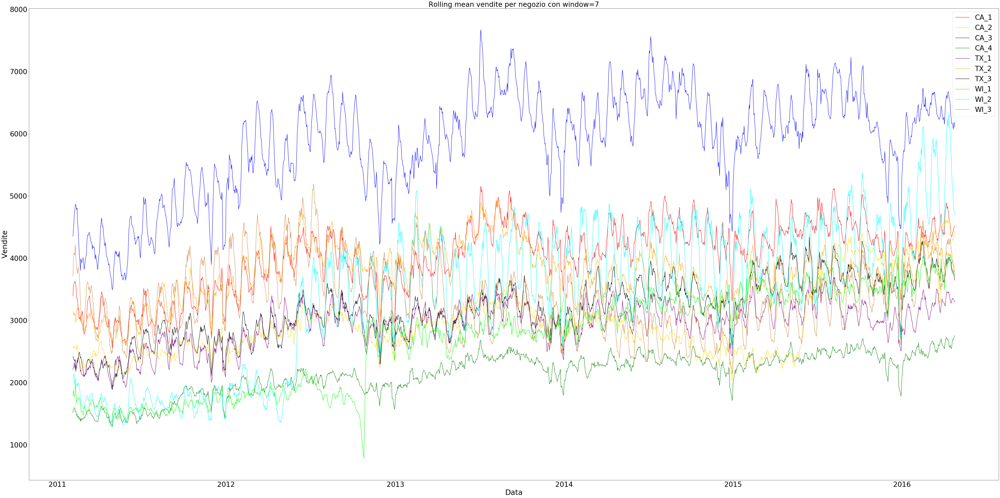

No handles with labels found to put in legend.
No handles with labels found to put in legend.


Operazione completata


No handles with labels found to put in legend.
No handles with labels found to put in legend.


Sto creando le serie temporali delle vendite per stato... Operazione completata
Genero le rolling mean per stato...  Operazione completata
Plot del grafico... 

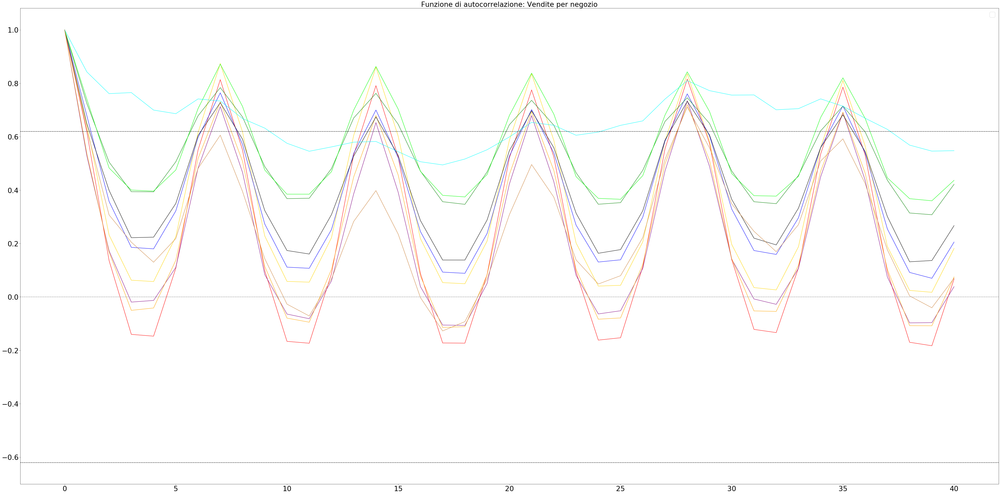

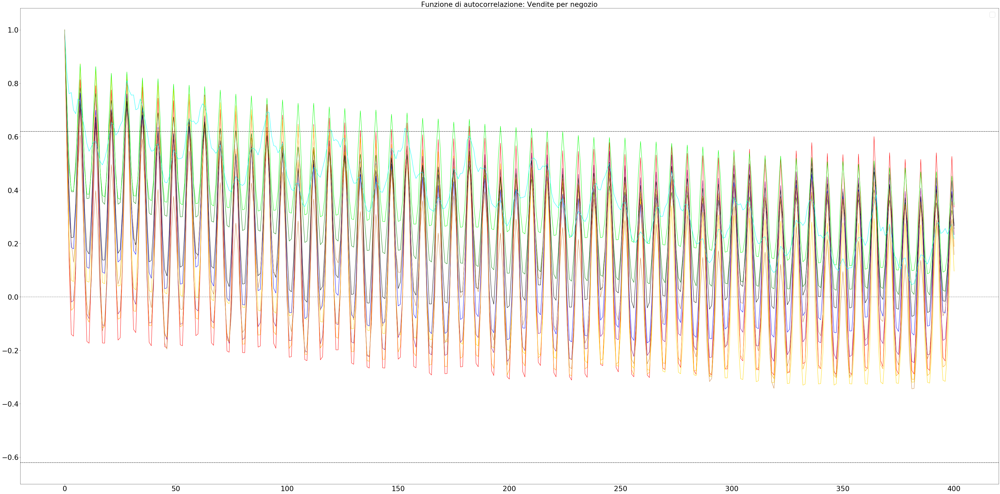

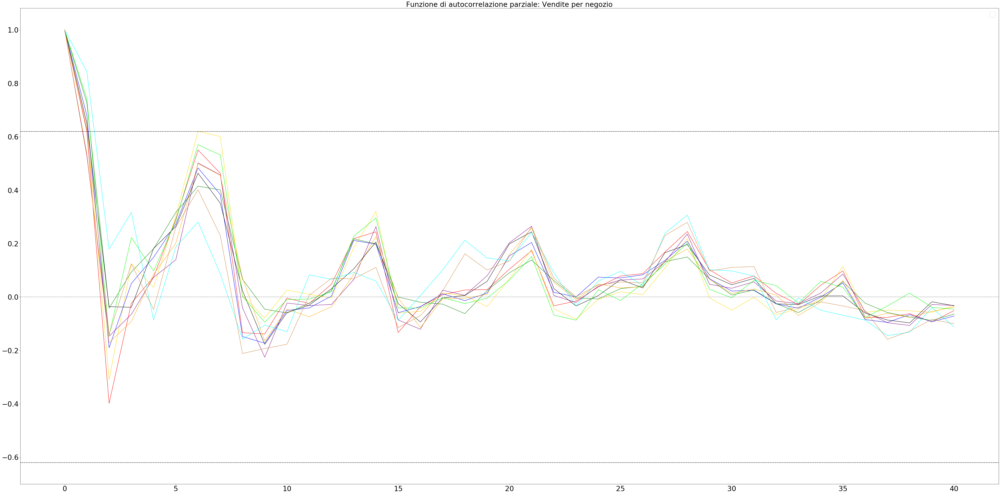

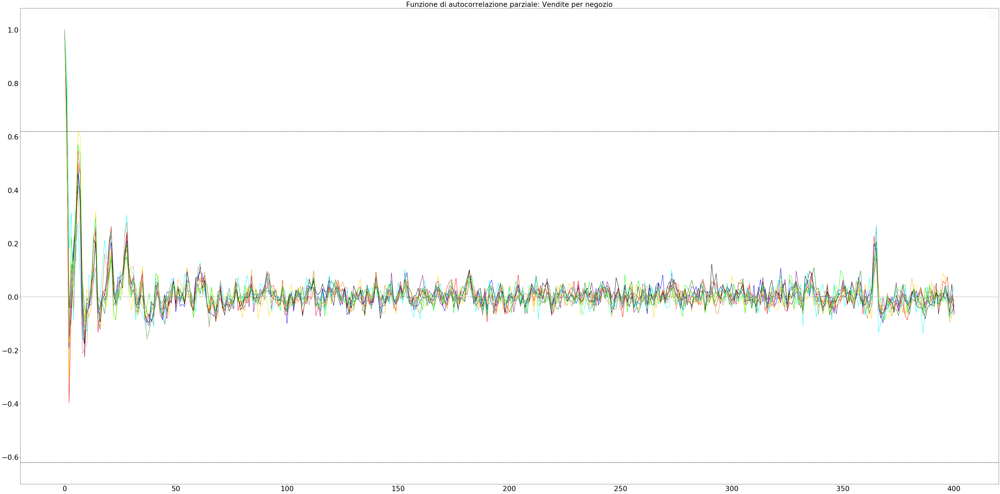

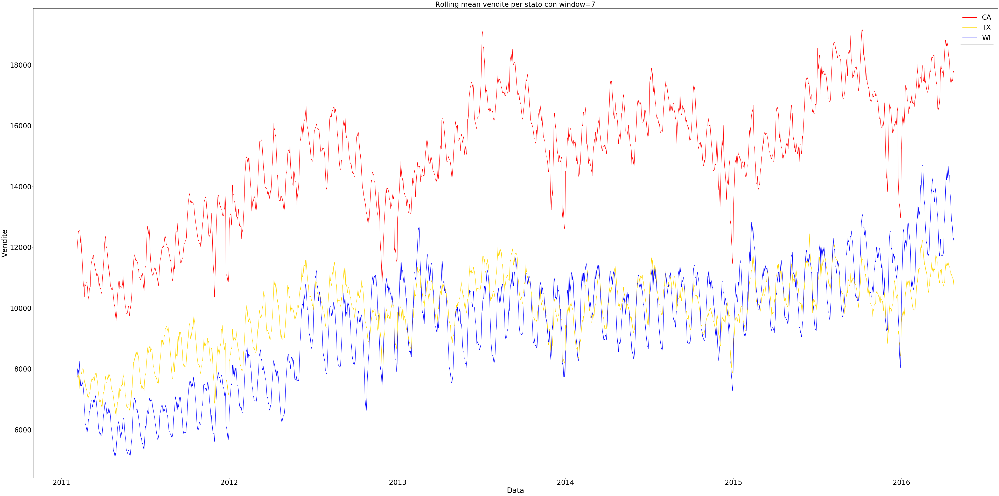

No handles with labels found to put in legend.
No handles with labels found to put in legend.


Operazione completata


No handles with labels found to put in legend.
No handles with labels found to put in legend.


Sto creando le serie temporali delle vendite per categoria... Operazione completata
Genero le rolling mean per categoria...  Operazione completata
Plot del grafico... 

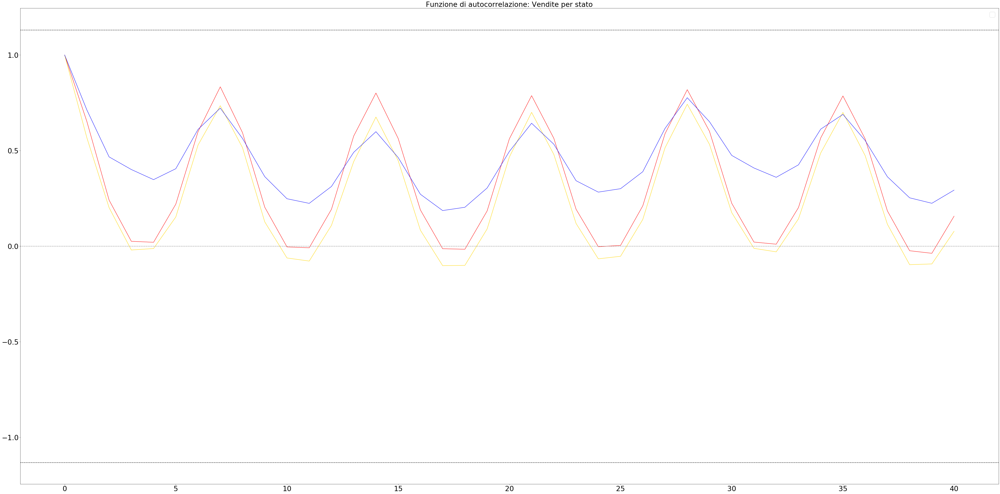

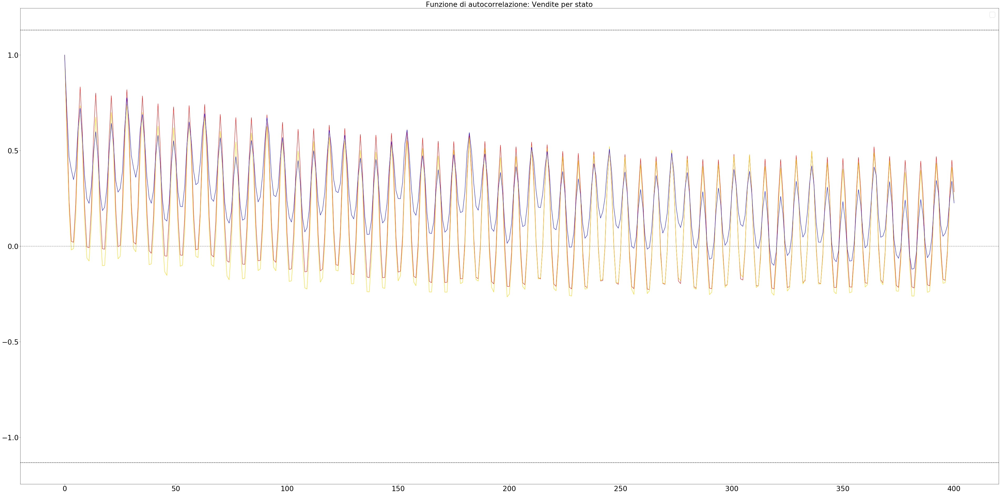

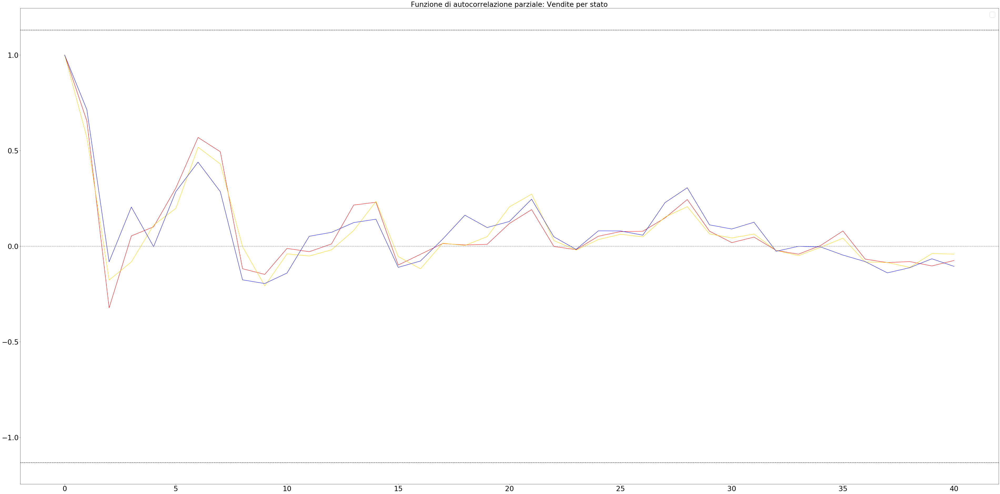

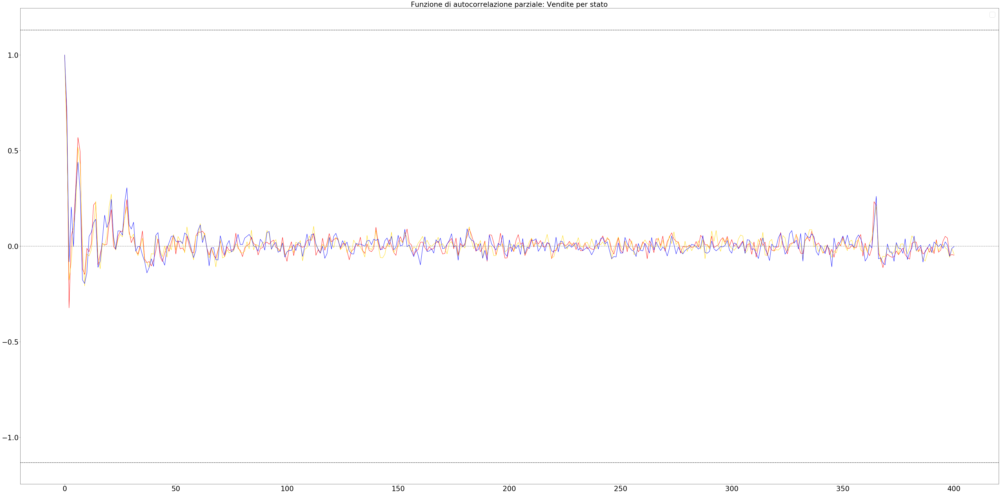

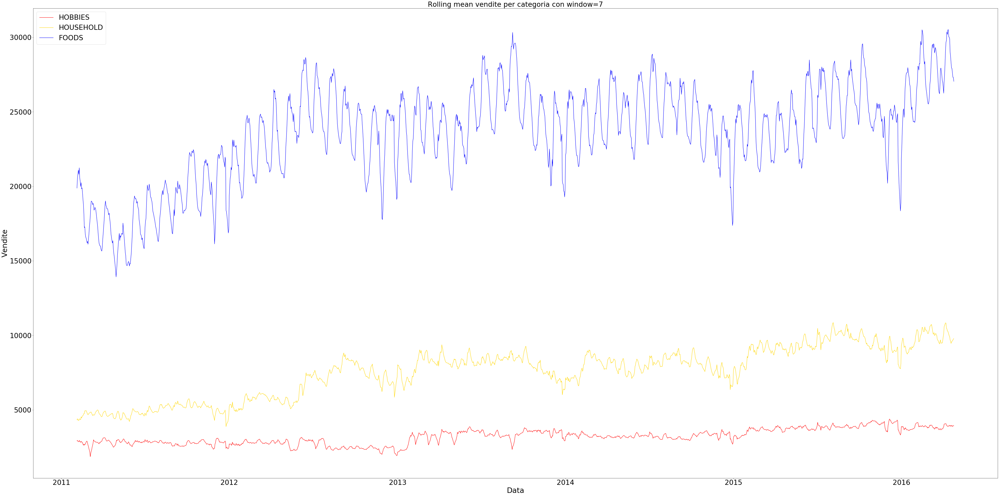

No handles with labels found to put in legend.
No handles with labels found to put in legend.


Operazione completata


No handles with labels found to put in legend.
No handles with labels found to put in legend.


Sto creando le serie temporali delle vendite per stato e categoria... Operazione completata
Genero le rolling mean per stato e categoria...  Operazione completata
Plot del grafico... 

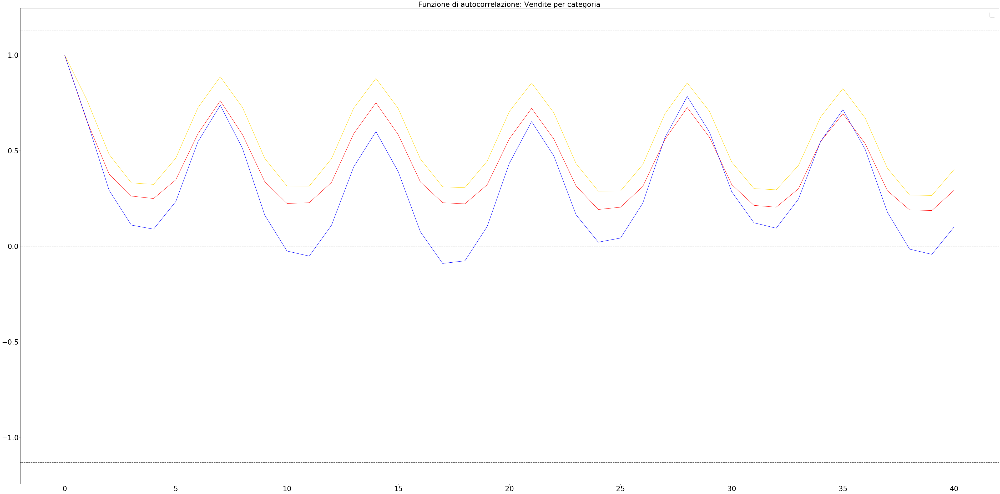

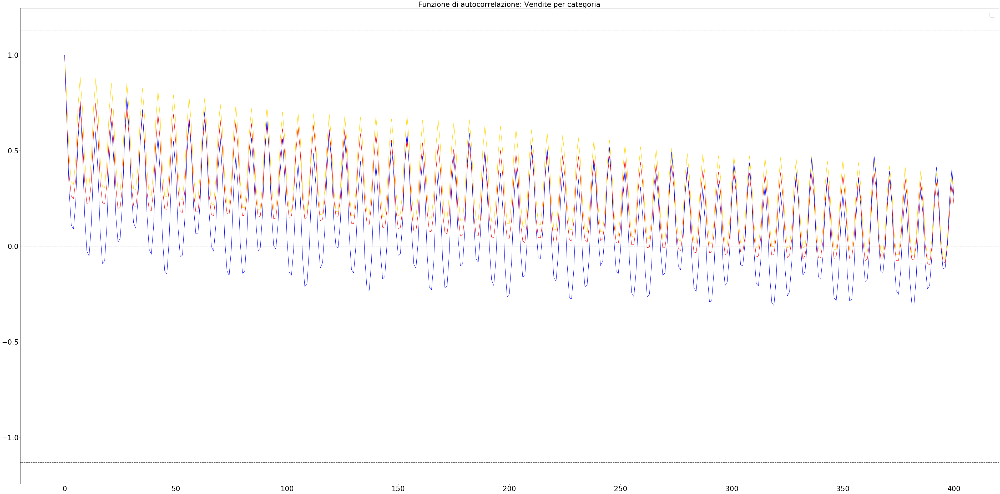

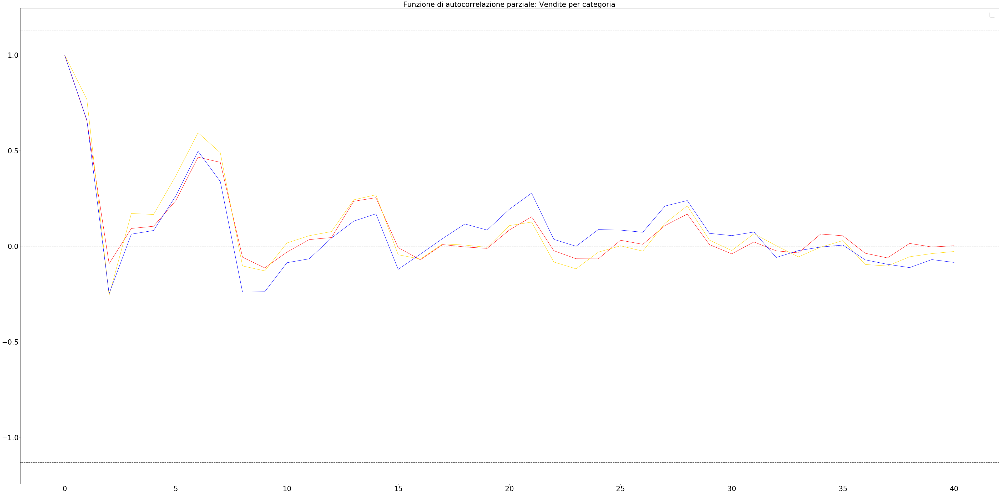

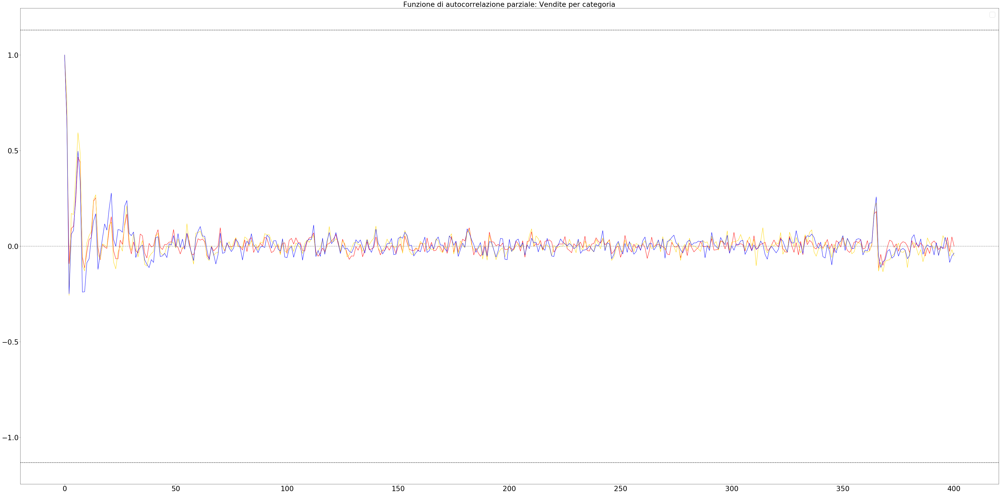

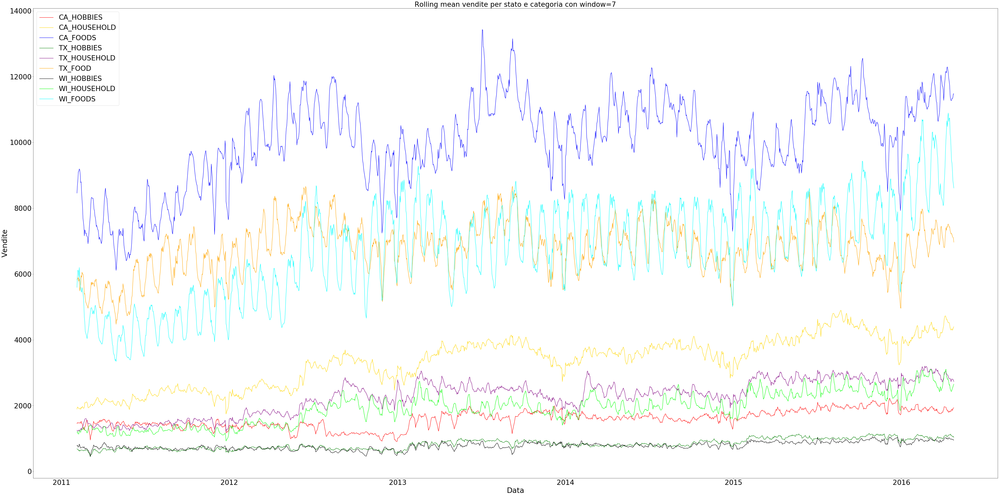

No handles with labels found to put in legend.
No handles with labels found to put in legend.


Operazione completata


No handles with labels found to put in legend.
No handles with labels found to put in legend.


Sto creando le serie temporali delle vendite per negozio e categoria... Operazione completata
Genero le rolling mean per negozio e categoria...  Operazione completata


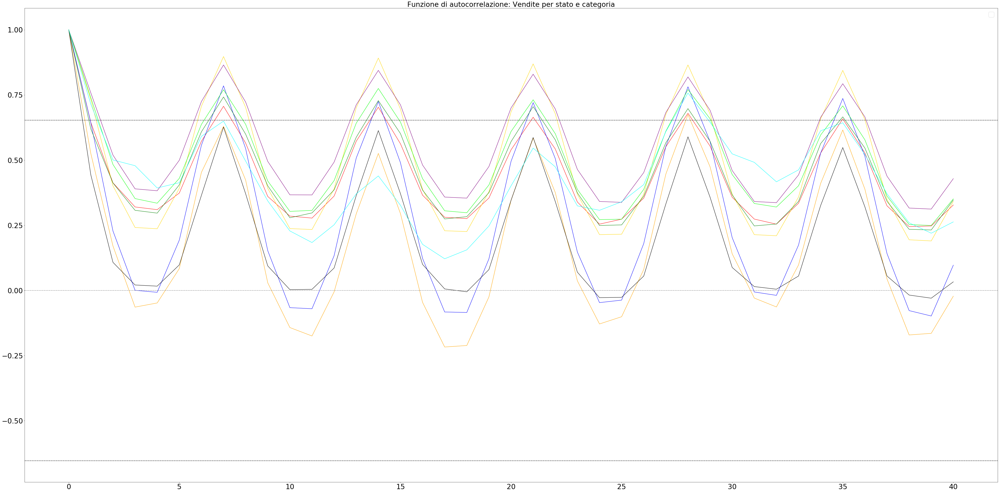

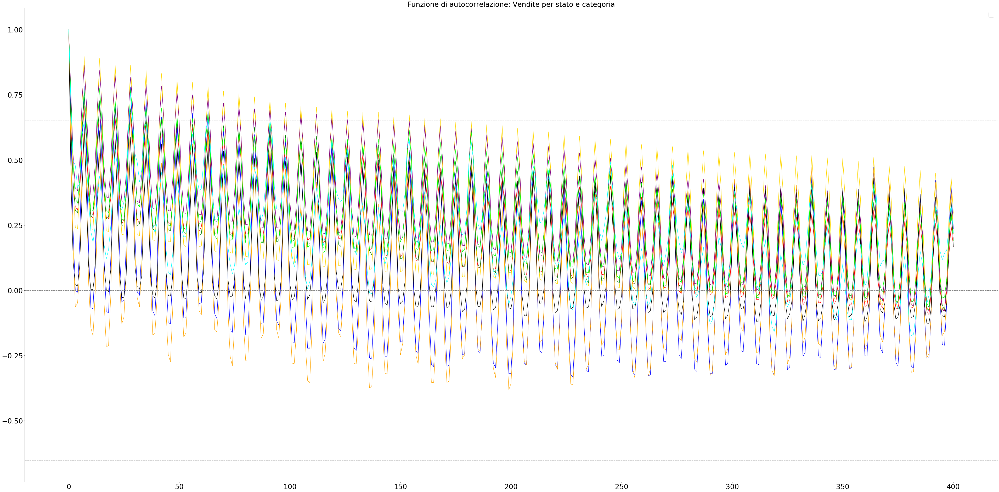

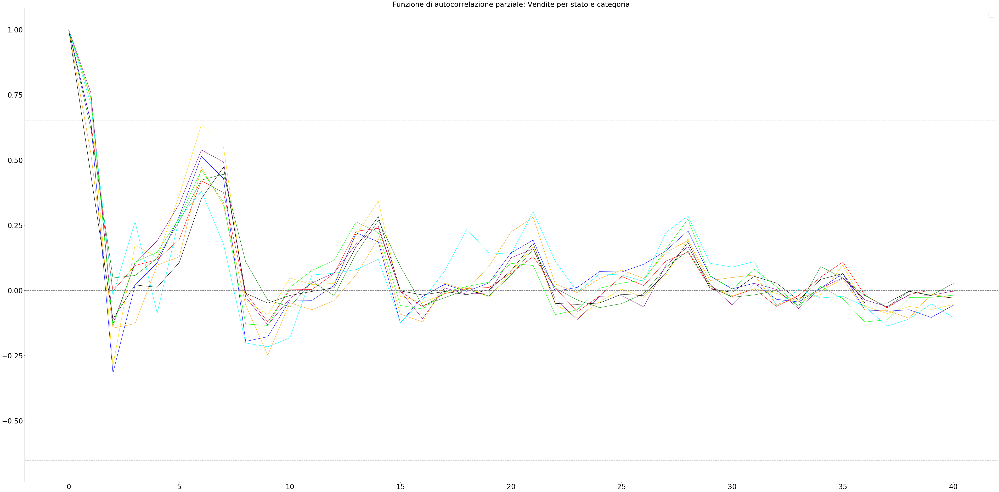

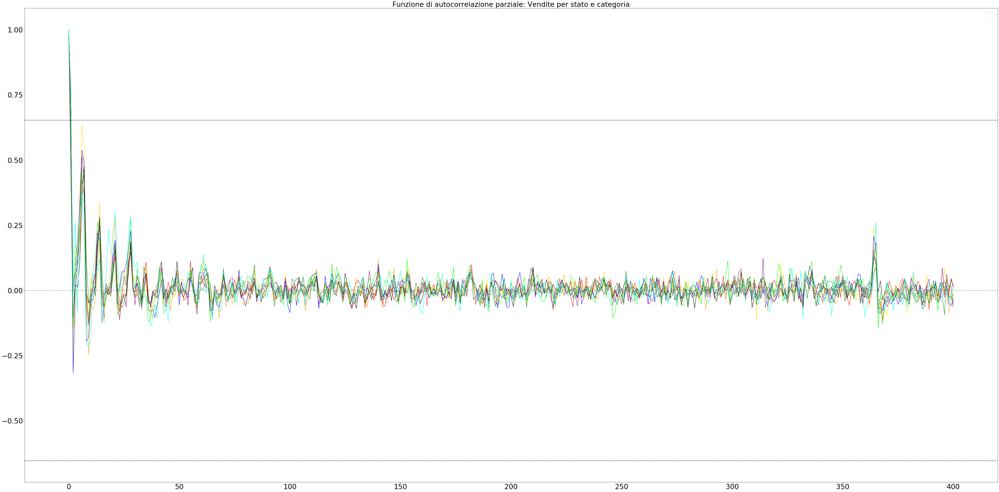

In [3]:
if __name__ == '__main__':
    # andiamo a caricare i dati del set di validazione (già pronto nel file sales_train_validation.csv)
    
    print('Caricamento sales_train_validation.csv ...', end=' ')
    sales_train = load_data('./datasets/sales_train_validation.csv')
    print('Carimento completato')
    
    # definiamo i nomi delle proprietà/campi che troviamo nel file sales_train_validation.csv
    shopNames = ['CA_1', 'CA_2', 'CA_3', 'CA_4', 'TX_1', 'TX_2', 'TX_3', 'WI_1', 'WI_2', 'WI_3']
    stateNames = ['CA', 'TX', 'WI']
    catNames = ['HOBBIES', 'HOUSEHOLD', 'FOODS']
    StatoAndCatNames = ['CA_HOBBIES', 'CA_HOUSEHOLD', 'CA_FOODS', 'TX_HOBBIES', 'TX_HOUSEHOLD', 'TX_FOOD',
                        'WI_HOBBIES', 'WI_HOUSEHOLD', 'WI_FOODS']
    

    # creiamo i DATAFRAME che rappresenteranno le serie temporali nelle sezioni successive
    print('Creazione serie temporali (ancora dataframe) ...', end=' ')
    
    # DATAFRAME per categoria
    hobby = sales_train[sales_train['cat_id'] == 'HOBBIES']
    household = sales_train[sales_train['cat_id'] == 'HOUSEHOLD']
    food = sales_train[sales_train['cat_id'] == 'FOODS']

    # DATAFRAME per negozio
    shopCA1 = sales_train[sales_train['store_id'] == 'CA_1']
    shopCA2 = sales_train[sales_train['store_id'] == 'CA_2']
    shopCA3 = sales_train[sales_train['store_id'] == 'CA_3']
    shopCA4 = sales_train[sales_train['store_id'] == 'CA_4']
    
    shopTX1 = sales_train[sales_train['store_id'] == 'TX_1']
    shopTX2 = sales_train[sales_train['store_id'] == 'TX_2']
    shopTX3 = sales_train[sales_train['store_id'] == 'TX_3']
    
    shopWI1 = sales_train[sales_train['store_id'] == 'WI_1']
    shopWI2 = sales_train[sales_train['store_id'] == 'WI_2']
    shopWI3 = sales_train[sales_train['store_id'] == 'WI_3']
    
    # DATAFRAME per stato
    stateCA = sales_train[sales_train['state_id'] == 'CA']
    stateTX = sales_train[sales_train['state_id'] == 'TX']
    stateWI = sales_train[sales_train['state_id'] == 'WI']

    # DATAFRAME per stato e categoria
    stateCAhobbies = sales_train[np.logical_and(sales_train['state_id'] == 'CA', sales_train['cat_id'] == 'HOBBIES')]
    stateCAhousehold = sales_train[np.logical_and(sales_train['state_id'] == 'CA', sales_train['cat_id'] == 'HOUSEHOLD')]
    stateCAfoods = sales_train[np.logical_and(sales_train['state_id'] == 'CA', sales_train['cat_id'] == 'FOODS')]
    
    stateTXhobbies = sales_train[np.logical_and(sales_train['state_id'] == 'TX', sales_train['cat_id'] == 'HOBBIES')]
    stateTXhousehold = sales_train[np.logical_and(sales_train['state_id'] == 'TX', sales_train['cat_id'] == 'HOUSEHOLD')]
    stateTXfoods = sales_train[np.logical_and(sales_train['state_id'] == 'TX', sales_train['cat_id'] == 'FOODS')]
    
    stateWIhobbies = sales_train[np.logical_and(sales_train['state_id'] == 'WI', sales_train['cat_id'] == 'HOBBIES')]
    stateWIhousehold = sales_train[np.logical_and(sales_train['state_id'] == 'WI', sales_train['cat_id'] == 'HOUSEHOLD')]
    stateWIfoods = sales_train[np.logical_and(sales_train['state_id'] == 'WI', sales_train['cat_id'] == 'FOODS')]    
    
    #DATAFRAME per negozio e categoria
    shopAndCatList = []
    for s in shopNames:
        storeShobbies = sales_train[np.logical_and(sales_train['store_id'] == s, sales_train['cat_id'] == 'HOBBIES')]
        storeShousehold = sales_train[np.logical_and(sales_train['store_id'] == s, sales_train['cat_id'] == 'HOUSEHOLD')]
        storeSfoods = sales_train[np.logical_and(sales_train['store_id'] == s, sales_train['cat_id'] == 'FOODS')]
        shopAndCatList.append(storeShobbies)
        shopAndCatList.append(storeShousehold)
        shopAndCatList.append(storeSfoods)
        
        
        
    # raggruppiamo i dataframe in base alle proprietà
    shopList = [shopCA1, shopCA2, shopCA3, shopCA4, shopTX1, shopTX2, shopTX3, shopWI1, shopWI2, shopWI3]
    stateList = [stateCA, stateTX, stateWI]
    catList = [hobby, household, food]
    stateAndCatList = [stateCAhobbies, stateCAhousehold, stateCAfoods, stateTXhobbies, stateTXhousehold,
                       stateTXfoods, stateWIhobbies, stateWIhousehold, stateWIfoods]
    
    print('Creazione completata')
    
    
    
    # definiamo l'array delle colonne d_1, ...., d_1913. Rappresentano i giorni dal 1 al 1913-esimo
    
    giorni = []
    for column in stateCA: # PRENDIAMO UN DATAFRAME FRA QUELLI SOPRA. TUTTI CONDIVIDONO LE COLONNE d_1,..., d_1913
        if 'd_' in column:
            giorni.append(column)
    
    
    # Serie temporali per negozio
    
    # Trasformiamo i dataframe dei negozi in serie temporali. Verranno mantenute dentro tsVenditeNegozio
    tsVenditeNegozio = []
    
    print('Sto creando le serie temporali delle vendite per negozio...', end=' ')
    for shop in shopList:
        tsVenditeNegozio.append(pd.Series(data=sumrows(shop, giorni), 
                                          index=pd.date_range(start=pd.Timestamp('2011-01-29'), periods=1913, freq='D')))
    print('Operazione completata')
    
    
    # Analiziamo le serie temporali dei negozi
    
    # Plottiamo la rolling mean (visualizziamo la componente TREND)
    rollingVenditeNegozio = []
    
    print('Genero le rolling mean per negozio... ', end=' ')
    for i in range(len(tsVenditeNegozio)):
        rollingVenditeNegozio.append(rolling(tsVenditeNegozio[i], w=7))
    print('Operazione completata')
    
    
    print('Plot del grafico...', end=' ')
    plot(rollingVenditeNegozio, shopNames, 'Rolling mean vendite per negozio con window=%d'%7)
    print('Operazione completata') 
    
    # Calcolo l'autocorrelazioni delle serie di vendite per negozio
    autocorrelation(tsVenditeNegozio, titleSpec = "Vendite per negozio", lags = 40)
    autocorrelation(tsVenditeNegozio, titleSpec = "Vendite per negozio", lags = 400)
    pautocorrelation(tsVenditeNegozio, titleSpec = "Vendite per negozio", lags = 40)
    pautocorrelation(tsVenditeNegozio, titleSpec = "Vendite per negozio", lags = 400)

    
    # Serie temporali per stato
    
    tsVenditeStato = []
    
    print('Sto creando le serie temporali delle vendite per stato...', end=' ')
    for state in stateList:
        tsVenditeStato.append(pd.Series(data=sumrows(state, giorni), 
                                          index=pd.date_range(start=pd.Timestamp('2011-01-29'), periods=1913, freq='D')))
    print('Operazione completata')
    
    
    # Analiziamo le serie temporali per stato
    
    # Plottiamo la rolling mean (visualizziamo la componente TREND)
    
    rollingVenditeStato = []
    
    print('Genero le rolling mean per stato... ', end=' ')
    for i in range(len(tsVenditeStato)):
        rollingVenditeStato.append(rolling(tsVenditeStato[i], w=7))
    print('Operazione completata')
    
    
    print('Plot del grafico...', end=' ')
    plot(rollingVenditeStato, stateNames, 'Rolling mean vendite per stato con window=%d'%7)
    print('Operazione completata')
    
    # Calcolo l'autocorrelazioni delle serie di vendite per stato
    autocorrelation(tsVenditeStato, titleSpec = "Vendite per stato", lags = 40)
    autocorrelation(tsVenditeStato, titleSpec = "Vendite per stato", lags = 400)
    pautocorrelation(tsVenditeStato, titleSpec = "Vendite per stato", lags = 40)
    pautocorrelation(tsVenditeStato, titleSpec = "Vendite per stato", lags = 400)
    
    
    # Serie temporali per categoria
    
    tsVenditeCat = []
    
    print('Sto creando le serie temporali delle vendite per categoria...', end=' ')
    for cat in catList:
        tsVenditeCat.append(pd.Series(data=sumrows(cat, giorni), 
                                          index=pd.date_range(start=pd.Timestamp('2011-01-29'), periods=1913, freq='D')))
    print('Operazione completata')
    
    
    
    # Analiziamo le serie temporali per categoria
    # Plottiamo la rolling mean (visualizziamo la componente TREND)
    
    rollingVenditeCat = []
    
    print('Genero le rolling mean per categoria... ', end=' ')
    for i in range(len(tsVenditeCat)):
        rollingVenditeCat.append(rolling(tsVenditeCat[i], w=7))
    print('Operazione completata')
    
    print('Plot del grafico...', end=' ')
    plot(rollingVenditeCat, catNames, 'Rolling mean vendite per categoria con window=%d'%7)
    print('Operazione completata')
    
    # Calcolo l'autocorrelazioni delle serie di vendite per categoria
    autocorrelation(tsVenditeCat, titleSpec = "Vendite per categoria", lags = 40)
    autocorrelation(tsVenditeCat, titleSpec = "Vendite per categoria", lags = 400)
    pautocorrelation(tsVenditeCat, titleSpec = "Vendite per categoria", lags = 40)
    pautocorrelation(tsVenditeCat, titleSpec = "Vendite per categoria", lags = 400)


    # Serie temporali per stato & categoria
    
    tsVenditeStatoAndCat = []
    
    print('Sto creando le serie temporali delle vendite per stato e categoria...', end=' ')
    for stateAndCat in stateAndCatList:
        tsVenditeStatoAndCat.append(pd.Series(data=sumrows(stateAndCat, giorni), 
                                          index=pd.date_range(start=pd.Timestamp('2011-01-29'), periods=1913, freq='D')))
    print('Operazione completata')

    
    # Analiziamo le serie temporali per stato & categoria
    # Plottiamo la rolling mean (visualizziamo la componente TREND)
    
    rollingVenditeStatoAndCat = []
    
    print('Genero le rolling mean per stato e categoria... ', end=' ')
    for i in range(len(tsVenditeStatoAndCat)):
        rollingVenditeStatoAndCat.append(rolling(tsVenditeStatoAndCat[i], w=7))
    print('Operazione completata')
   
    
    print('Plot del grafico...', end=' ')
    plot(rollingVenditeStatoAndCat, StatoAndCatNames, 'Rolling mean vendite per stato e categoria con window=%d'%7)
    print('Operazione completata')
    
    
    # Calcolo l'autocorrelazioni delle serie di vendite per categoria
    autocorrelation(tsVenditeStatoAndCat, titleSpec = "Vendite per stato e categoria", lags = 40)
    autocorrelation(tsVenditeStatoAndCat, titleSpec = "Vendite per stato e categoria", lags = 400)
    pautocorrelation(tsVenditeStatoAndCat, titleSpec = "Vendite per stato e categoria", lags = 40)
    pautocorrelation(tsVenditeStatoAndCat, titleSpec = "Vendite per stato e categoria", lags = 400)
    
    
    
    #%%
    # Serie temporali per negozio & categoria
    
    tsVenditeNegozioAndCat = []
    
    print('Sto creando le serie temporali delle vendite per negozio e categoria...', end=' ')
    for shopAndCat in shopAndCatList:
        tsVenditeNegozioAndCat.append(pd.Series(data=sumrows(shopAndCat, giorni), 
                                          index=pd.date_range(start=pd.Timestamp('2011-01-29'), periods=1913, freq='D')))
    print('Operazione completata')    
    
    # Analizziamo le serie temporali per negozio & categoria
    
    rollingVenditeNegozioAndCat = []
    
    print('Genero le rolling mean per negozio e categoria... ', end=' ')
    for i in range(len(tsVenditeNegozioAndCat)):
        rollingVenditeNegozioAndCat.append(rolling(tsVenditeNegozioAndCat[i], w=7))
    print('Operazione completata')

Dopo aver analizzato le serie temporali dei vari livelli della gerarchia, ora possiamo concentrarci sulle previsioni della serie gerarchica. 
- generiamo le previsioni delle vendite per negozio e categoria (serie di livello più basso nella gerarchia) usando la funzione ETS_DECOMPOSITION_FORECASTING
- usando l'approccio bottom-up costruiamo le previsioni delle serie di livello più alto fino ad arrivare alla previsioni delle vendite totali.
- generiamo le metriche d'errore
- generiamo le previsione della serie totale senza usare bottom-up ma usando ETS_DECOMPOSITION_FORECASTING sulla serie delle vendite totali
- comparariamo le previsioni generate con bottom-up e le previsioni generate nella maniera classica.


In [ ]:
    # Abbiamo la seguente gerarchia:
    # +(liv. 0)      vendite TOTALI
    # +(liv. 1)      vendite per STATO
    # +(liv. 2)      vendite per NEGOZIO
    # +(liv. 3)      vendite per NEGOZIO & CATEGORIA
    
    
    # noi usiamo l'approccio bottom-up. Prima realizziamo le previsioni
    # delle serie temporali per NEGOZIO & CATEGORIA poi raggruppiamo le serie temporali
    # per NEGOZIO ottenendo "vendite per NEGOZIO" poi raggruppando ulteriormente
    # abbiamo quelle per "STATO" e infine le vendite "TOTALI"
    
    # partiamo da NEGOZIO & CATEGORIA
    
    print('Stime modelli delle previsioni per NEGOZIO & CATEGORIA...')
    
    
    # Parte dove determiniamo i modelli predittivi delle serie di più basso livello nella gerarchia.
    # Dato che è molto lunga la generazione (più di 45 minuti) la lasciamo commentata e carichiamo
    # da file le previsioni precedentemente fatte.
    """
    ind = 0
    j = 0
    tsForecastingNegozioAndCat = []
    for ts in tsVenditeNegozioAndCat:
        model,forecasting = ETS_DECOMPOSITION_FORECASTING(ts,periodo=365, h=1941-1913)
        print(f'ETS_DECOMPOSITION_FORECASTING completato per {shopNames[j]}_{catNames[ind%3]}')
        tsForecastingNegozioAndCat.append(forecasting)
        if (ind+1)%3 == 0:
            j += 1
        ind += 1
        
    print('Operazione completata')
    
    # salviamo l'oggetto tsForecastingNegozioAndCat su un file per usarlo in momenti successivi
    print('Salvo l\'oggetto "tsForecastingNegozioAndCat" su file così da caricarlo in momenti successivi')
    
    save_obj(tsForecastingNegozioAndCat, 'tsForecastingNegozioAndCat.pyobj')
    
    """
    
    tsForecastingNegozioAndCat = load_obj('./datasets/tsForecastingNegozioAndCat.pyobj')
    
    print('Caricamento di "tsForecastingNegozioAndCat" completato')
    
    
    # procediamo con il raggruppare le previsioni per NEGOZIO
    
    # 3 serie  per ogni negozio (CA1, CA2, CA3, CA4,   TX1, TX2, TX3,   WI1, W2, W3)
    
    print("Raggruppiamo le previsioni serie temporali per NEGOZIO...")
    ts_Ger_ForecastingNegozio = []
    i = 0
    j = 0
    while i < len(tsForecastingNegozioAndCat):
        ts_Ger_ForecastingNegozio.append(tsForecastingNegozioAndCat[i])
        ts_Ger_ForecastingNegozio[j] += tsForecastingNegozioAndCat[i+1]
        ts_Ger_ForecastingNegozio[j] += tsForecastingNegozioAndCat[i+2]
        i = i+3
        j += 1
    
    print('Operazione completata')
    
    # procediamo con il raggruppare le previsioni per STATO
    
    # 4 serie per lo stato CA
    # 3 serie per lo stato TX
    # 3 serie per lo stato WI
    
    print('Sommiamo le previsioni in base all\'appartenenza di un negozio ad uno STATO...')
    
    ts_Ger_ForecastingStato = []
    state = shopNames[0] + 'ABCD'     # stringa non presente nei nomi dei negozi
    ind = 0
    
    for s in shopNames:
        if state in s:
            ts_Ger_ForecastingStato[len(ts_Ger_ForecastingStato) - 1] += ts_Ger_ForecastingNegozio[ind]
        else:
            state = s[0:2]
            ts_Ger_ForecastingStato.append(ts_Ger_ForecastingNegozio[ind])
            
        ind += 1
    
    print('Operazione completata')
    
    
    # procediamo con il raggruppare le previsioni ottenendo le previsioni TOTALI
    # sommiamo le tre previsioni precedenti
    
    print('Sommiamo le previsioni per ogni STATO ottenendo le previsioni di vendita TOTALI...')
    
    ts_Ger_ForecastingVenditeTot = ts_Ger_ForecastingStato[0][:]    #[:] per eseguire una copia
    ts_Ger_ForecastingVenditeTot += ts_Ger_ForecastingStato[1]
    ts_Ger_ForecastingVenditeTot += ts_Ger_ForecastingStato[2]
    
    print('Operazione completata')
    
    
    print('Grafico delle previsioni per le vendite totali...')
    
    
    
    
    # operazioni per estrarre i dati reali da sales_train_evaluation.csv
    
    sales_train_evaluation = load_data('./datasets/sales_train_evaluation.csv')
    stateCAeval = sales_train_evaluation[sales_train_evaluation['state_id'] == 'CA']
    stateTXeval = sales_train_evaluation[sales_train_evaluation['state_id'] == 'TX']
    stateWIeval = sales_train_evaluation[sales_train_evaluation['state_id'] == 'WI']
    stateListEval = [stateCAeval, stateTXeval, stateWIeval]
    
    tsVenditeStatoEval = []
    for state in stateListEval:
        tsVenditeStatoEval.append(pd.Series(data=sumrows(state, giorni), 
                                          index=pd.date_range(start=pd.Timestamp('2011-01-29'), periods=1941, freq='D')))
    
    tsVenditeTotEval = tsVenditeStatoEval[0][:]
    tsVenditeTotEval += tsVenditeStatoEval[1]
    tsVenditeTotEval += tsVenditeStatoEval[2]
    
    # ultimi 28 giorni
    tsVenditeTotValSet = tsVenditeTotEval[1913:]
    
    # creo il grafico
    tsVenditeTot = tsVenditeStato[0][:]
    tsVenditeTot += tsVenditeStato[1]
    tsVenditeTot += tsVenditeStato[2]
    plot_results([tsVenditeTot['2015-01-01':], tsVenditeTotValSet, ts_Ger_ForecastingVenditeTot], ['vendite totali', 'set di valutazione', 'previsioni'], 'Previsioni con ETS per le vendite totali (bottom-up)')

    
    # metriche di errore
    errore = ts_Ger_ForecastingVenditeTot - tsVenditeTotValSet
    #errore.dropna(inplace=True)
    print('RMSE=%.4f'%np.sqrt((errore ** 2).mean()))
    print('MAE=%.4f'%(abs(errore)).mean())
    print('MAPE=%.4f'%(abs(100*errore/tsVenditeTotValSet)).mean())

    print('Operazione completata')
    
    # %%
    
    print('Forecast diretto sulle vendite totali...')
    
    model, tsForecastingVenditeTot = ETS_DECOMPOSITION_FORECASTING(tsVenditeTot, periodo=365, h=1941-1913)
    print(f'MASE ETS_DECOMPOSITION_FORECASTING applicato a VENDITE TOTALI')
    
    plot_results([tsVenditeTot['2015-01-01':], tsVenditeTotValSet, tsForecastingVenditeTot], ['vendite totali', 'set di valutazione', 'previsioni'], 'Previsioni con ETS per le vendite totali (diretto)')
    
    # metriche di errore
    errore = tsForecastingVenditeTot - tsVenditeTotValSet
    #errore.dropna(inplace=True)
    print('RMSE=%.4f'%np.sqrt((errore ** 2).mean()))
    print('MAE=%.4f'%(abs(errore)).mean())
    print('MAPE=%.4f'%(abs(100*errore/tsVenditeTotValSet)).mean())
    
    # grafico comparativo
    plot_results([tsVenditeTot['2016-03-01':], tsVenditeTotValSet, ts_Ger_ForecastingVenditeTot, tsForecastingVenditeTot], ['vendite totali', 'set di valutazione', 'predizione con aggregazione', 'predizione sul totale'], 'Previsioni con ETS per le vendite totali (comparazione)')
    
    print('Operazione completata')

### Osservazioni

|      | vendite totali (bottom-up)  | vendite totali (forecasting diretto)  |
| ---  |   -------: | -------: |
| MAPE |     5.7696 |   5.8267 |
| MAE  |  2734.1371 |2746.6567 |

Come possiamo vedere, le metriche d'errore fra le previsioni dirette e le previsioni usando l'approccio bottom-up non si discostano molto. Il grande vantaggio delle serie gerarchiche è che le serie temporali sono legate e quindi anche le loro previsioni. Eseguendo il forecasting delle serie temporali alla base della gerarchia riusciamo ad ottenere anche le previsioni di tutte le serie che fanno parte della gerarchia creando $m$ modelli.

# Bibliografia


- https://local.disia.unifi.it/marliani/stat_eco_A/seriestoriche2.pdf
- https://robjhyndman.com/files/3-Hierarchical.pdf
